In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
sns.set_theme()

In [2]:
df_music = pd.read_csv('data/music_data_train.csv')
df_meta = pd.read_csv('data/metadata_train.csv', parse_dates=['album_date_created', 'album_date_released']) #There are actually more datetimes

In [3]:
df_music.drop(df_music.columns[[0,1]],axis=1,inplace=True)
df_music

,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,chroma_cens_kurtosis_09,chroma_cens_kurtosis_10,...,tonnetz_std_04,tonnetz_std_05,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01
0,-0.250264,0.853314,-0.250518,-0.437696,0.013198,-1.021593,-0.836816,-0.254251,-0.199717,0.180869,...,0.080442,0.030151,0.021039,17.128071,0.501465,0.043760,0.027344,0.000000,3.780074,0.058005
1,0.374798,0.520247,0.123421,0.597581,-0.079274,0.379201,0.719628,0.695120,3.238711,0.634973,...,0.068494,0.013151,0.016409,26.544762,0.378418,0.056068,0.051758,0.000000,3.035795,0.024940
2,-0.591106,-0.809871,-0.851459,-0.821814,-0.491761,3.074906,0.281267,-0.253128,-0.536536,-0.563363,...,0.086165,0.016936,0.017190,4.436679,0.179199,0.031260,0.026855,0.000000,1.735184,0.021370
3,-0.079107,-0.127845,0.005323,0.787337,1.438901,0.748163,0.160749,0.925747,0.728732,0.134825,...,0.043772,0.015301,0.016556,1.358216,0.300781,0.087239,0.074219,0.000000,1.113161,0.049388
4,-1.026874,-0.908802,-0.622557,0.027511,-1.320974,0.147019,-1.407950,0.131482,-1.260598,-1.483003,...,0.169021,0.029011,0.024545,2.235282,0.273438,0.063478,0.055176,0.000000,1.337780,0.037244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85254,0.614229,1.897446,0.339425,0.112619,-0.078175,0.736528,1.604501,0.915538,0.871614,-0.176430,...,0.050771,0.013933,0.014238,3.589796,0.568359,0.114187,0.076172,0.001465,1.833088,0.127112
85255,0.160378,-0.649751,-0.980687,-0.629211,0.018084,1.462188,2.767480,0.885054,-1.241300,-1.154892,...,0.185212,0.032124,0.036915,3.241642,0.451660,0.096799,0.089355,0.000000,1.204189,0.052644
85256,-0.369009,-0.144337,0.617757,0.724496,0.936516,0.788056,0.716168,0.755378,0.416353,-0.086954,...,0.079129,0.022782,0.020156,9.686974,0.499023,0.046200,0.038086,0.000000,2.021433,0.036127
85257,28.288076,-1.813722,-1.139785,-0.960647,-1.607906,-1.228129,-0.935928,-1.050963,-0.869851,15.749822,...,0.190877,0.021760,0.041180,-1.259940,0.035645,0.019396,0.013672,0.001953,0.678326,0.008328


In [4]:
df_meta

,track_id,album_comments,album_date_created,album_date_released,album_engineer,album_favorites,album_id,album_information,album_listens,album_producer,...,track_information,track_interest,track_language_code,track_license,track_listens,track_lyricist,track_number,track_publisher,track_tags,track_title
0,35229,0,2010-09-04 15:47:48,2010-09-04,NaN,0,7243,NaN,4252,NaN,...,NaN,668,NaN,Attribution-NonCommercial-NoDerivatives (aka M...,320,NaN,5,NaN,"['floating spirits', 'electronic', 'various ar...",Distant Reflection 2010
1,110938,0,2014-11-13 18:40:58,2014-11-13,Matt Marando,0,17161,<p>North and South American habitual Regatta w...,7717,Pat Byrne,...,NaN,283,NaN,Creative Commons Attribution-NonCommercial-NoD...,156,NaN,8,NaN,[],Garbage Night/Sweatpants Lament/Throggs Neck
2,94241,0,2013-11-19 12:14:39,2008-03-29,NaN,0,15477,<p>Short 3 track ep by Italian Electro Rock pr...,12258,NaN,...,NaN,6188,NaN,Attribution-NonCommercial-ShareAlike 3.0 Inter...,4008,NaN,2,NaN,[],Are You Afraid?
3,41754,0,2011-01-03 16:16:30,2011-01-01,NaN,1,8221,<p>Music Beyond No Borders is a compilation se...,4173,Wok The Rock,...,NaN,348,NaN,Attribution-NonCommercial-NoDerivatives (aka M...,271,NaN,3,NaN,[],1994
4,136912,-1,NaT,NaT,NaN,-1,20556,NaN,-1,NaN,...,NaN,14641,NaN,Attribution-NonCommercial,11690,NaN,5,NaN,[],Another Rainy Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85254,73284,0,2012-11-30 14:26:41,2012-12-01,NaN,8,12974,"<p>117 participating acts, with 108 pieces of ...",54443,Classwar Karaoke,...,NaN,447,NaN,Attribution-NonCommercial-NoDerivatives (aka M...,286,NaN,88,NaN,[],d.2012
85255,143261,0,2016-09-18 11:23:03,NaT,NaN,0,21498,NaN,21001,NaN,...,NaN,1184,NaN,Attribution-NonCommercial-ShareAlike,1001,NaN,2,NaN,[],moralische Killer
85256,9937,0,2009-03-12 08:13:10,NaT,NaN,0,2098,NaN,4335,NaN,...,NaN,672,en,Attribution-NonCommercial-NoDerivatives (aka M...,504,NaN,0,NaN,[],Digital Primitives Live at Levontin 7
85257,116534,0,2015-03-18 04:51:41,2015-03-18,NaN,1,17938,"<p><span style=""color: #626262; font-family: '...",20121,NaN,...,NaN,5240,NaN,Creative Commons Attribution-NonCommercial-NoD...,4479,NaN,4,NaN,"['female vocals', 'japan', 'finland', 'melodic...",Aurora


In [106]:
# Feature reader
class Feats():

    def __init__(self, csv):
        self.fts = pd.read_csv(csv, dtype={'n':"string"})
        self.fts = self.fts.fillna('')

    def format(self, select):
        return select.apply(lambda x: '_'.join(x).replace('__', '_'), axis=1).tolist()

    def all(self):
        select = self.fts.copy()
        return self.format(select)

    def first(self):
        select = self.fts.copy()
        select = select.loc[select['n']=='01']
        return self.format(select)
    
    def kurtosis(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='kurtosis']
        return self.format(select)

    def mean(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='mean']
        return self.format(select)

fts = Feats('features.csv')


['chroma_cens_mean_01', 'chroma_cens_mean_02', 'chroma_cens_mean_03', 'chroma_cens_mean_04', 'chroma_cens_mean_05', 'chroma_cens_mean_06', 'chroma_cens_mean_07', 'chroma_cens_mean_08', 'chroma_cens_mean_09', 'chroma_cens_mean_10', 'chroma_cens_mean_11', 'chroma_cens_mean_12', 'chroma_cqt_mean_01', 'chroma_cqt_mean_02', 'chroma_cqt_mean_03', 'chroma_cqt_mean_04', 'chroma_cqt_mean_05', 'chroma_cqt_mean_06', 'chroma_cqt_mean_07', 'chroma_cqt_mean_08', 'chroma_cqt_mean_09', 'chroma_cqt_mean_10', 'chroma_cqt_mean_11', 'chroma_cqt_mean_12', 'chroma_stft_mean_01', 'chroma_stft_mean_02', 'chroma_stft_mean_03', 'chroma_stft_mean_04', 'chroma_stft_mean_05', 'chroma_stft_mean_06', 'chroma_stft_mean_07', 'chroma_stft_mean_08', 'chroma_stft_mean_09', 'chroma_stft_mean_10', 'chroma_stft_mean_11', 'chroma_stft_mean_12', 'mfcc_mean_01', 'mfcc_mean_02', 'mfcc_mean_03', 'mfcc_mean_04', 'mfcc_mean_05', 'mfcc_mean_06', 'mfcc_mean_07', 'mfcc_mean_08', 'mfcc_mean_09', 'mfcc_mean_10', 'mfcc_mean_11', 'mfcc_m

#### PCA

In [20]:
# import datetime

# bins = date
df = df_music
df['released'] = pd.cut(df_meta['album_date_released'].dt.year, bins=[1900, 1960, 1970, 1980, 1990, 2000, 2010, 2020, 2022], right=False)
df

,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,chroma_cens_kurtosis_09,chroma_cens_kurtosis_10,...,tonnetz_std_05,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01,released
0,-0.250264,0.853314,-0.250518,-0.437696,0.013198,-1.021593,-0.836816,-0.254251,-0.199717,0.180869,...,0.030151,0.021039,17.128071,0.501465,0.043760,0.027344,0.000000,3.780074,0.058005,"[2010.0, 2020.0)"
1,0.374798,0.520247,0.123421,0.597581,-0.079274,0.379201,0.719628,0.695120,3.238711,0.634973,...,0.013151,0.016409,26.544762,0.378418,0.056068,0.051758,0.000000,3.035795,0.024940,"[2010.0, 2020.0)"
2,-0.591106,-0.809871,-0.851459,-0.821814,-0.491761,3.074906,0.281267,-0.253128,-0.536536,-0.563363,...,0.016936,0.017190,4.436679,0.179199,0.031260,0.026855,0.000000,1.735184,0.021370,"[2000.0, 2010.0)"
3,-0.079107,-0.127845,0.005323,0.787337,1.438901,0.748163,0.160749,0.925747,0.728732,0.134825,...,0.015301,0.016556,1.358216,0.300781,0.087239,0.074219,0.000000,1.113161,0.049388,"[2010.0, 2020.0)"
4,-1.026874,-0.908802,-0.622557,0.027511,-1.320974,0.147019,-1.407950,0.131482,-1.260598,-1.483003,...,0.029011,0.024545,2.235282,0.273438,0.063478,0.055176,0.000000,1.337780,0.037244,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85254,0.614229,1.897446,0.339425,0.112619,-0.078175,0.736528,1.604501,0.915538,0.871614,-0.176430,...,0.013933,0.014238,3.589796,0.568359,0.114187,0.076172,0.001465,1.833088,0.127112,"[2010.0, 2020.0)"
85255,0.160378,-0.649751,-0.980687,-0.629211,0.018084,1.462188,2.767480,0.885054,-1.241300,-1.154892,...,0.032124,0.036915,3.241642,0.451660,0.096799,0.089355,0.000000,1.204189,0.052644,NaN
85256,-0.369009,-0.144337,0.617757,0.724496,0.936516,0.788056,0.716168,0.755378,0.416353,-0.086954,...,0.022782,0.020156,9.686974,0.499023,0.046200,0.038086,0.000000,2.021433,0.036127,NaN
85257,28.288076,-1.813722,-1.139785,-0.960647,-1.607906,-1.228129,-0.935928,-1.050963,-0.869851,15.749822,...,0.021760,0.041180,-1.259940,0.035645,0.019396,0.013672,0.001953,0.678326,0.008328,"[2010.0, 2020.0)"


In [99]:
import plotly.express as px
from sklearn.decomposition import PCA

df = df_music
bins = [1900, 1960, 1970, 1980, 1990, 2000, 2010, 2020, 2022]
labels = ['<1960', "'60s", "'70s", "'80s", "'90s", "'00s", "'10s", ">2020"]
df['released_cat'] = pd.cut(df_meta['album_date_released'].dt.year, bins=bins, labels=labels, right=False)
df['released_cat'] = df['released_cat'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(X=df[fts.mean()])

fig = px.scatter(components, x=0, y=1, color=df['released_cat'])
fig.show()

In [39]:
df = df_music
df['released'] = df_meta['album_date_released'].dt.year
# df['released'] = df['released'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(df.iloc[:, 0:-1])

fig = px.scatter(components, x=0, y=1, color=df['released'])
fig.show()

In [45]:
df = df_music
bins = [0, 10, 100, 1000, 10000, 100000, 1000000]
labels = ["1s", "10s", "100s", "1000s", "10.000s", "100.000s"]
df['listens_cat'] = pd.cut(df_meta['track_listens'], bins=bins, labels=labels, right=False)
df['listens_cat'] = df['listens_cat'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(df.iloc[:, 0:-2])

fig = px.scatter(components, x=0, y=1, color=df['listens_cat'])
fig.show()

#### Data inspection

count     85259.000000
mean       2316.089011
std        7989.535783
min           0.000000
25%         293.000000
50%         765.000000
75%        2013.000000
max      543252.000000
Name: track_listens, dtype: float64

NAs: 0
infs: 0


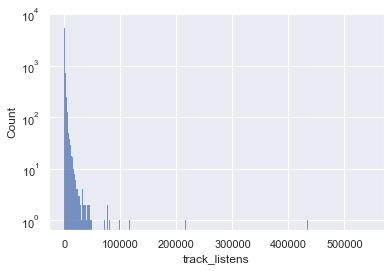

In [4]:
# Task 1
print(df_meta.track_listens.describe())

print(f'\nNAs: {df_meta.track_listens.isna().sum()}')
print(f'infs: {df_meta.track_listens.isin([np.inf, -np.inf]).values.sum()}')
# histplot throws an error for a seemingly inf number though

sns.histplot(data=df_meta, x="track_listens", log_scale=(False, True));

/var/folders/f0/_n2_f9zd4sv9gqjchz9g5qb40000gn/T/ipykernel_3959/3697636949.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  print(df_meta.album_date_released.describe())


count                   56344
unique                   3611
top       2008-01-01 00:00:00
freq                      541
first     1902-01-01 00:00:00
last      2021-03-01 00:00:00
Name: album_date_released, dtype: object

NAs: 28915/85259: 0.339 %


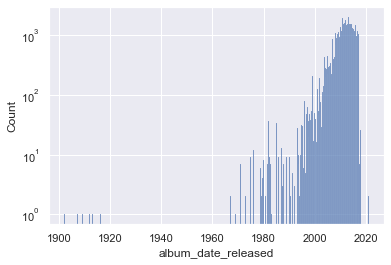

In [5]:
# Task 2
print(df_meta.album_date_released.describe())

nulls = df_meta.album_date_released.isnull().sum()
total = df_meta.album_date_released.size
print(f'\nNAs: {nulls}/{total}: {round(nulls/total, 3)} %')

# df_meta_2 = df_meta.dropna(subset='album_date_released')

sns.histplot(data=df_meta, x="album_date_released", log_scale=(False, True));

In [10]:
df_music.describe()

,Unnamed: 0,track_id,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,...,tonnetz_std_04,tonnetz_std_05,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01
count,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,...,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000,85259.000000
mean,53317.373016,79484.767004,0.489624,0.209874,0.342757,0.296547,0.307669,0.308399,0.302881,0.364048,...,0.098551,0.021556,0.021866,29.509738,0.381427,0.052797,0.043592,0.002341,3.212066,0.040370
std,30765.457318,44704.699470,36.047869,12.310437,10.768575,21.248488,16.496465,11.824840,18.953109,17.222040,...,0.037048,0.006071,0.006109,91.753075,0.183545,0.032609,0.031682,0.005137,3.053010,0.027320
min,0.000000,2.000000,-1.955806,-1.936607,-1.967450,-3.000000,-1.921206,-1.923740,-1.935382,-3.000000,...,0.005928,0.000087,0.001941,-1.949780,0.010254,0.000055,0.000000,0.000000,-15.727972,0.000436
25%,26755.500000,40937.500000,-0.636098,-0.665810,-0.630273,-0.643929,-0.656607,-0.620608,-0.644280,-0.634988,...,0.071179,0.017227,0.017534,3.315158,0.246582,0.032988,0.024902,0.000000,1.401026,0.022092
50%,53294.000000,78991.000000,-0.176151,-0.222198,-0.152243,-0.190770,-0.197472,-0.151183,-0.187722,-0.159396,...,0.093395,0.020624,0.020964,9.664951,0.357422,0.047161,0.037598,0.000000,2.402642,0.033626
75%,80034.000000,119578.000000,0.484612,0.408476,0.528177,0.445193,0.453629,0.512106,0.472640,0.529670,...,0.120871,0.024986,0.025225,26.955564,0.471680,0.064684,0.054199,0.002930,4.070892,0.051317
max,106573.000000,155320.000000,8843.367188,2864.075195,1777.615967,4257.045898,3188.034424,2809.779297,4281.090820,3869.482178,...,0.332470,0.092869,0.116128,8438.014648,0.999512,0.878024,0.895996,0.257812,78.084976,0.424317


In [16]:
print(df_music.isna().sum().sum())
print(df_music.duplicated().sum())

0
0


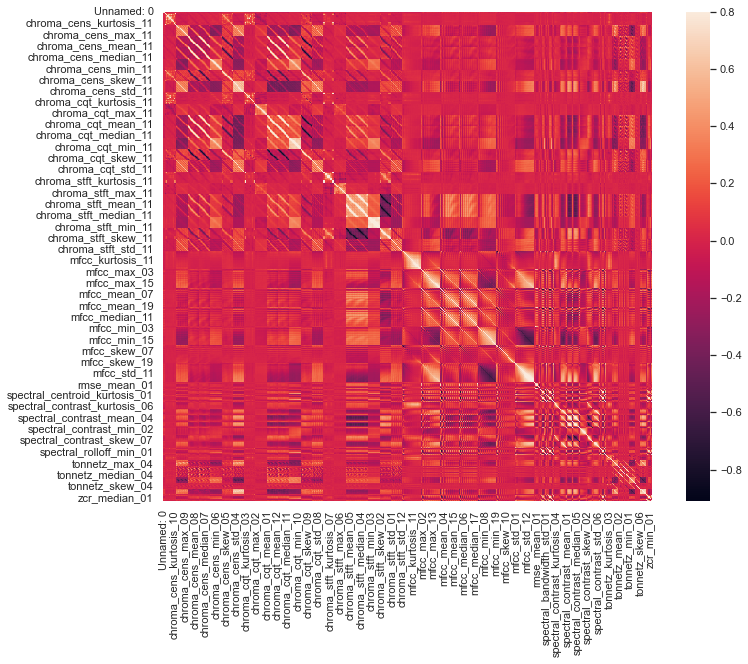

In [12]:
corrmat = df_music.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

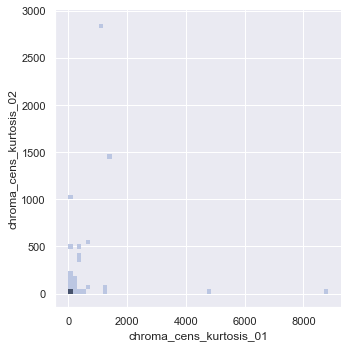

In [10]:
sns.displot(df_music, x="chroma_cens_kurtosis_01", y="chroma_cens_kurtosis_02", bins=60)

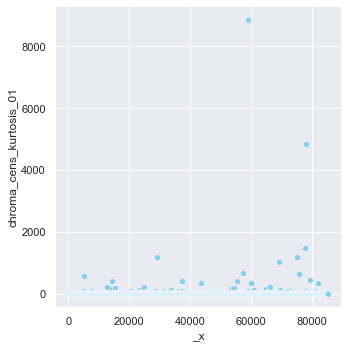

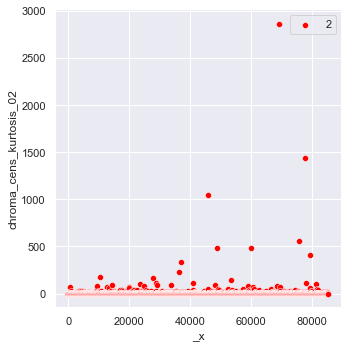

In [20]:
sns.relplot(x=df_music.index, y="chroma_cens_kurtosis_01", color="skyblue", label="1", data=df_music)
sns.relplot(x=df_music.index, y="chroma_cens_kurtosis_02", color="red", label="2", data=df_music)

plt.legend() 
plt.show()

#### Preprocessing